In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from imblearn.over_sampling import RandomOverSampler
sns.set(style='whitegrid')

In [2]:
train=pd.read_csv('train.csv')
test=pd.read_csv('test.csv')
train

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
0,1,Male,44,1,28.0,0,> 2 Years,Yes,40454.0,26.0,217,1
1,2,Male,76,1,3.0,0,1-2 Year,No,33536.0,26.0,183,0
2,3,Male,47,1,28.0,0,> 2 Years,Yes,38294.0,26.0,27,1
3,4,Male,21,1,11.0,1,< 1 Year,No,28619.0,152.0,203,0
4,5,Female,29,1,41.0,1,< 1 Year,No,27496.0,152.0,39,0
...,...,...,...,...,...,...,...,...,...,...,...,...
381104,381105,Male,74,1,26.0,1,1-2 Year,No,30170.0,26.0,88,0
381105,381106,Male,30,1,37.0,1,< 1 Year,No,40016.0,152.0,131,0
381106,381107,Male,21,1,30.0,1,< 1 Year,No,35118.0,160.0,161,0
381107,381108,Female,68,1,14.0,0,> 2 Years,Yes,44617.0,124.0,74,0


In [3]:
from sklearn.preprocessing import LabelEncoder 
labelEncoder= LabelEncoder()
train['Gender'] = labelEncoder.fit_transform(train['Gender'])
train['Vehicle_Age'] = labelEncoder.fit_transform(train['Vehicle_Age'])
train['Vehicle_Damage'] = labelEncoder.fit_transform(train['Vehicle_Damage'])

In [4]:
X=train.drop(['Response','id'],axis=1) 
y=train['Response'] 

Original dataset shape Counter({0: 334399, 1: 46710})
Resampled dataset shape Counter({1: 334399, 0: 334399})


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Response', ylabel='count'>

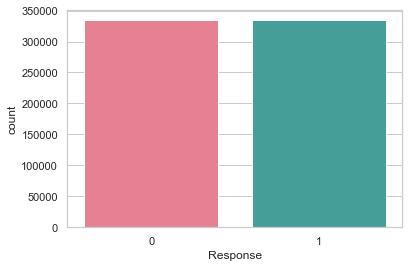

In [5]:
from imblearn.over_sampling import RandomOverSampler

randomsample=  RandomOverSampler()
X_new,y_new=randomsample.fit_resample(X,y)

from collections import Counter
print('Original dataset shape {}'.format(Counter(y)))
print('Resampled dataset shape {}'.format(Counter(y_new)))
sns.countplot(y_new,palette='husl')

In [6]:
from sklearn.model_selection import train_test_split

#Training and Test Data for Model Selection
X_train, X_test, y_train, y_test= train_test_split(X_new, y_new, test_size=0.25, random_state=0)
print(X_train.shape,X_test.shape,y_train.shape,y_test.shape)

#Data Pre-Processing
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
X_train=scaler.fit_transform(X_train)
X_test=scaler.transform(X_test)

(501598, 10) (167200, 10) (501598,) (167200,)


In [7]:
pip install optuna

     |████████████████████████████████| 308 kB 2.0 MB/s            
     |████████████████████████████████| 80 kB 3.9 MB/s            
     |████████████████████████████████| 209 kB 2.4 MB/s            
     |████████████████████████████████| 1.5 MB 8.4 MB/s            
     |████████████████████████████████| 92 kB 738 kB/s            
     |████████████████████████████████| 75 kB 1.8 MB/s             
     |████████████████████████████████| 112 kB 4.7 MB/s            
     |████████████████████████████████| 149 kB 6.0 MB/s            
     |████████████████████████████████| 49 kB 3.2 MB/s             
  Preparing metadata (setup.py) ... done
  Created wheel for pyperclip: filename=pyperclip-1.8.2-py3-none-any.whl size=11106 sha256=91f0dd3ddfdfc906ddae6fe311c635b0111f19b31d5b2188a8905537974e4cf6
  Stored in directory: /Users/anishabajaj/Library/Caches/pip/wheels/7f/1a/65/84ff8c386bec21fca6d220ea1f5498a0367883a78dd5ba6122
Successfully built pyperclip
Note: you may need to restart the ke

In [10]:
import optuna  # pip install optuna
from sklearn.metrics import log_loss
from sklearn.model_selection import StratifiedKFold
import lightgbm as lgbm

from optuna.integration import LightGBMPruningCallback

def objective(trial, X, y):
    param_grid = {
        # "device_type": trial.suggest_categorical("device_type", ['gpu']),
        "n_estimators": trial.suggest_categorical("n_estimators", [10000]),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3),
        "num_leaves": trial.suggest_int("num_leaves", 20, 3000, step=20),
        "max_depth": trial.suggest_int("max_depth", 3, 12),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 200, 10000, step=100),
        "lambda_l1": trial.suggest_int("lambda_l1", 0, 100, step=5),
        "lambda_l2": trial.suggest_int("lambda_l2", 0, 100, step=5),
        "min_gain_to_split": trial.suggest_float("min_gain_to_split", 0, 15),
        "bagging_fraction": trial.suggest_float(
            "bagging_fraction", 0.2, 0.95, step=0.1
        ),
        "bagging_freq": trial.suggest_categorical("bagging_freq", [1]),
        "feature_fraction": trial.suggest_float(
            "feature_fraction", 0.2, 0.95, step=0.1
        ),
    }

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=1121218)

    cv_scores = np.empty(5)
    for idx, (train_idx, test_idx) in enumerate(cv.split(X, y)):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        model = lgbm.LGBMClassifier(objective="binary", **param_grid)
        model.fit(
            X_train,
            y_train,
            eval_set=[(X_test, y_test)],
            eval_metric="binary_logloss",
            early_stopping_rounds=100,
            callbacks=[
                LightGBMPruningCallback(trial, "binary_logloss")
            ],  # Add a pruning callback
        )
        preds = model.predict_proba(X_test)
        cv_scores[idx] = log_loss(y_test, preds)

    return np.mean(cv_scores)

In [12]:
study = optuna.create_study(direction="minimize", study_name="LGBM Classifier")
func = lambda trial: objective(trial, X_new, y_new)
study.optimize(func, n_trials=20)

[I 2021-12-04 22:15:57,433] A new study created in memory with name: LGBM Classifier
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callbac

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] lambda_l2 is set=75, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] min_gain_to_split is set=13.556990717633418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.556990717633418
[LightGBM] [Warning] lambda_l1 is set=70, reg_alpha=0.0 will be ignored. Current value: lambda_l1=70


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `s

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 285 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 286 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 287 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 325 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 326 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 327 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 328 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 365 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 366 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 367 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 368 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 407 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 408 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 409 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 410 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] lambda_l2 is set=75, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] min_gain_to_split is set=13.556990717633418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.556990717633418
[LightGBM] [Warning] lambda_l1 is set=70, reg_alpha=0.0 will be ignored. Current value: lambda_l1=70


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `s

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 286 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 287 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 289 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] lambda_l2 is set=75, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] min_gain_to_split is set=13.556990717633418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.556990717633418
[LightGBM] [Warning] lambda_l1 is set=70, reg_alpha=0.0 will be ignored. Current value: lambda_l1=70


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `s

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 289 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 290 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 291 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 292 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 331 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 332 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 333 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 334 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 370 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 371 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 372 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 373 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 409 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 410 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 411 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 412 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] lambda_l2 is set=75, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] min_gain_to_split is set=13.556990717633418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.556990717633418
[LightGBM] [Warning] lambda_l1 is set=70, reg_alpha=0.0 will be ignored. Current value: lambda_l1=70


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `s

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 285 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 322 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 323 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 324 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 362 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 363 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 364 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 365 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 401 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 402 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 403 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 404 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 442 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 443 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 444 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 445 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 482 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 483 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 484 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 485 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] lambda_l2 is set=15, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] min_gain_to_split is set=3.189549614804062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.189549614804062
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] lambda_l2 is set=15, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] min_gain_to_split is set=3.189549614804062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.189549614804062
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `s

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 285 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 322 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 323 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 324 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 362 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 363 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 364 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 400 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 401 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 402 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 403 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 439 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 440 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 441 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 442 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 478 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 479 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 480 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 481 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 517 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 518 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 519 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 520 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 557 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 558 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 559 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 560 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 598 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 599 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 600 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 601 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 638 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 639 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 640 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 641 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 677 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 678 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 679 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 680 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 716 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 717 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 718 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 719 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 757 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 758 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 759 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 760 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 797 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 798 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 799 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 800 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 837 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 838 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 839 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 840 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 878 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 879 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 880 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 881 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 917 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 918 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 919 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 920 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 958 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 959 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 960 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 961 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 998 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 999 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1000 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1001 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored becau

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1039 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1040 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1041 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1042 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1079 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1080 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1081 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1082 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1118 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1119 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1120 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1121 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1158 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1159 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1160 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1161 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1198 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1199 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1200 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1201 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1237 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1238 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1239 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1240 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1276 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1277 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1278 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1279 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1317 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1318 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1319 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1320 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1358 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1359 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1360 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1361 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1397 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1398 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1399 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1400 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1438 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1439 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1440 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1441 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1477 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1478 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1479 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1480 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] lambda_l2 is set=15, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] min_gain_to_split is set=3.189549614804062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.189549614804062
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `s

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 285 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 323 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 324 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 325 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 326 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 362 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 363 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 364 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 365 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 402 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 403 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 404 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 405 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 441 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 442 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 443 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 444 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 480 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 481 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 482 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 483 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 519 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 520 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 521 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 522 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 558 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 559 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 560 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 561 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 599 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 600 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 601 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 602 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 638 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 639 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 640 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 641 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 678 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 679 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 680 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 681 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 719 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 720 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 721 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 722 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 759 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 760 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 761 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 762 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 798 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 799 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 800 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 801 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 838 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 839 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 840 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 841 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 877 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 878 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 879 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 880 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 918 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 919 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 920 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 921 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 959 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 960 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 961 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 962 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 999 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1000 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1001 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1002 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored beca

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] lambda_l2 is set=15, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] min_gain_to_split is set=3.189549614804062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.189549614804062
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `s

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 322 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 323 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 324 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 360 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 362 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 363 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 399 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 400 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 401 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 402 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 440 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 441 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 442 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 443 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 479 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 480 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 481 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 482 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 521 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 522 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 523 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 524 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 560 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 561 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 562 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 563 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 600 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 601 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 602 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 603 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 639 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 640 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 641 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 642 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 679 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 680 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 681 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 682 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 720 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 721 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 722 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 723 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 760 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 761 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 762 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 763 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 800 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 801 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 802 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 803 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 840 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 841 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 842 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 843 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 879 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 880 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 881 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 882 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 920 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 921 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 922 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 923 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 960 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 961 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 962 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 963 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1001 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1002 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1003 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1004 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1040 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1041 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1042 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1043 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1079 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1080 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1081 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1082 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1119 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1120 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1121 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1122 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1158 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1159 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1160 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1161 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1198 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1199 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1200 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1201 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1237 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1238 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1239 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1240 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1276 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1277 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1278 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1279 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1318 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1319 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1320 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1321 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1358 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1359 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1360 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1361 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1397 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1398 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1399 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1400 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] lambda_l2 is set=15, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] min_gain_to_split is set=3.189549614804062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.189549614804062
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `s

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 322 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 323 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 359 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 360 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 362 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 398 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 399 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 400 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 401 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 439 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 440 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 441 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 442 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 480 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 481 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 482 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 483 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 519 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 520 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 521 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 522 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 559 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 560 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 561 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 562 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 599 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 600 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 601 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 602 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 639 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 640 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 641 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 642 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 678 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 679 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 680 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 681 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 717 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 718 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 719 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 720 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 758 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 759 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 760 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 761 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 797 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 798 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 799 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 800 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 836 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 837 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 838 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 839 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 876 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 877 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 878 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 879 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 915 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 916 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 917 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 918 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 956 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 957 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 958 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 959 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 997 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 998 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 999 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1000 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored becaus

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1036 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1037 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1038 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1039 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1075 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1076 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1077 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1078 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1116 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1117 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1118 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1119 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1155 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1156 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1157 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1158 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1196 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1197 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1198 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1199 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1236 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1237 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1238 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1239 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1277 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1278 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1279 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1280 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1317 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1318 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1319 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1320 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1358 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1359 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1360 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1361 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1397 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1398 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1399 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1400 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1436 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1437 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1438 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1439 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1476 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1477 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1478 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1479 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] min_gain_to_split is set=4.254520558691757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.254520558691757
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] min_gain_to_split is set=4.254520558691757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.254520558691757
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `s

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 358 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 359 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 360 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 397 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 398 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 399 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 400 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 436 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 437 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 438 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 439 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 476 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 477 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 478 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 479 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 516 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 517 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 518 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 519 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 557 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 558 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 559 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 560 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 598 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 599 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 600 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 601 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 637 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 638 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 639 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 640 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 676 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 677 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 678 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 679 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 717 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 718 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 719 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 720 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 758 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 759 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 760 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 761 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 798 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 799 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 800 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 801 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 837 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 838 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 839 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 840 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 876 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 877 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 878 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 879 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 915 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 916 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 917 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 918 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 955 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 956 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 957 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 958 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 997 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 998 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 999 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1000 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored becaus

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1036 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1037 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1038 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1039 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1076 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1077 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1078 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1079 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1117 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1118 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1119 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1120 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1156 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1157 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1158 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1159 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1195 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1196 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1197 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1198 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1236 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1237 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1238 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1239 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1276 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1277 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1278 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1279 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1316 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1317 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1318 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1319 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1356 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1357 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1358 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1359 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1397 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1398 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1399 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1400 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1437 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1438 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1439 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1440 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1479 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1480 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1481 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1482 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1518 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1519 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1520 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1521 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1557 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1558 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1559 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1560 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1596 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1597 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1598 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1599 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1635 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1636 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1637 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1638 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1674 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1675 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1676 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1677 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1715 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1716 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1717 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1718 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1755 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1756 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1757 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1758 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1796 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1797 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1798 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1799 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1836 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1837 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1838 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1839 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1875 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1876 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1877 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1878 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1914 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1915 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1916 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1917 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1954 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1955 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1956 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1957 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1995 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1996 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1997 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1998 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2035 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2036 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2037 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2038 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2076 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2077 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2078 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2079 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2116 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2117 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2118 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2119 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] min_gain_to_split is set=4.254520558691757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.254520558691757
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `s

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 356 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 357 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 358 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 359 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 396 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 397 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 398 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 399 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 435 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 436 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 437 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 438 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 475 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 476 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 477 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 478 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 514 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 515 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 516 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 517 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 553 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 554 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 555 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 556 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 592 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 593 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 594 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 595 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 632 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 633 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 634 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 635 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 671 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 672 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 673 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 674 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 710 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 711 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 712 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 713 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 749 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 750 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 751 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 752 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 788 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 789 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 790 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 791 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 828 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 829 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 830 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 831 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 867 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 868 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 869 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 870 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 906 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 907 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 908 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 909 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 946 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 947 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 948 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 949 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 986 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 987 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 988 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 989 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1025 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1026 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1027 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1028 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1064 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1065 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1066 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1067 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1104 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1105 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1106 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1107 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1146 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1147 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1148 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1149 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1185 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1186 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1187 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1188 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1226 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1227 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1228 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1229 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1266 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1267 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1268 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1269 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1305 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1306 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1307 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1308 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1346 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1347 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1348 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1349 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1387 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1388 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1389 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1390 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1427 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1428 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1429 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1430 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1467 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1468 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1469 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1470 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1506 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1507 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1508 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1509 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1545 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1546 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1547 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1548 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1586 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1587 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1588 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1589 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1625 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1626 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1627 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1628 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1665 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1666 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1667 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1668 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1707 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1708 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1709 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1710 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1747 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1748 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1749 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1750 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1787 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1788 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1789 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be remove

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] min_gain_to_split is set=4.254520558691757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.254520558691757
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `s

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 285 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 322 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 323 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 324 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 362 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 363 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 364 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 401 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 402 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 403 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 404 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 440 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 441 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 442 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 443 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 481 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 482 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 483 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 484 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 522 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 523 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 524 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 525 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 562 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 563 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 564 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 565 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 601 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 602 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 603 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 604 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 641 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 642 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 643 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 644 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 682 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 683 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 684 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 685 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 721 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 722 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 723 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 724 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 760 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 761 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 762 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 763 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 802 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 803 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 804 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 805 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 843 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 844 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 845 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 846 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 882 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 883 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 884 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 885 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 923 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 924 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 925 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 926 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 964 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 965 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 966 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 967 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1005 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1006 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1007 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1008 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1046 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1047 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1048 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1049 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1087 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1088 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1089 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1090 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1126 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1127 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1128 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1129 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1165 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1166 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1167 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1168 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1205 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1206 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1207 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1208 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1245 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1246 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1247 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1248 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1284 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1285 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1286 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1287 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1324 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1325 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1326 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1327 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1363 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1364 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1365 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1366 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1404 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1405 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1406 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1407 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1444 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1445 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1446 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1447 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1484 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1485 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1486 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1487 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1524 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1525 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1526 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1527 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1565 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1566 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1567 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1568 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1606 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1607 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1608 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1609 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1645 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1646 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1647 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1648 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1684 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1685 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1686 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1687 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1723 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1724 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1725 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1726 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1763 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1764 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1765 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1766 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1802 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1803 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1804 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1805 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1841 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1842 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1843 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1844 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1881 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1882 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1883 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1884 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1920 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1921 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1922 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1923 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1961 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1962 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1963 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1964 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2002 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2003 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2004 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2005 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2042 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2043 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2044 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2045 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2081 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2082 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2083 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2084 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2120 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2121 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2122 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2123 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2160 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2161 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2162 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2163 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2200 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2201 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2202 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2203 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2240 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2241 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2242 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2243 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2280 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2281 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2282 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2283 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2319 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2320 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2321 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2322 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2359 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2360 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2361 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2362 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2399 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2400 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2401 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2402 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2439 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2440 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2441 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2442 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2478 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2479 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2480 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2481 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2518 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2519 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2520 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2521 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2558 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2559 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2560 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2561 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2597 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2598 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2599 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2600 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2637 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2638 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2639 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2640 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2676 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2677 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2678 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2679 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2715 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2716 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2717 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2718 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2755 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2756 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2757 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2758 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2796 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2797 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2798 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2799 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2835 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2836 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2837 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2838 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2874 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2875 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2876 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2877 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2913 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2914 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2915 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2916 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2952 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2953 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2954 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2955 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2992 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2993 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2994 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2995 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3032 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3033 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3034 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3035 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] min_gain_to_split is set=4.254520558691757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.254520558691757
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `s

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 358 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 359 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 360 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 397 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 398 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 399 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 400 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 436 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 437 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 438 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 439 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 475 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 476 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 477 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 478 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 515 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 516 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 517 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 518 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 554 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 555 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 556 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 557 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 594 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 595 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 596 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 597 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 634 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 635 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 636 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 637 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 673 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 674 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 675 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 676 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 713 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 714 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 715 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 716 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 753 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 754 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 755 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 756 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 793 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 794 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 795 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 796 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 833 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 834 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 835 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 836 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 874 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 875 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 876 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 877 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 913 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 914 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 915 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 916 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 952 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 953 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 954 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 955 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 993 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 994 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 995 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 996 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1032 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1033 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1034 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1035 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1072 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1073 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1074 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1075 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1111 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1112 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1113 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1114 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1150 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1151 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1152 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1153 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1192 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1193 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1194 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1195 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1232 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1233 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1234 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1235 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1272 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1273 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1274 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1275 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1311 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1312 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1313 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1314 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1351 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1352 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1353 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1354 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1391 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1392 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1393 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1394 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1432 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1433 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1434 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1435 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1473 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1474 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1475 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1476 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1513 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1514 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1515 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1516 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1554 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1555 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1556 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1557 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1593 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1594 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1595 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1596 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1632 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1633 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1634 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1635 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1671 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1672 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1673 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1674 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1710 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1711 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1712 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1713 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1750 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1751 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1752 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1753 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1791 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1792 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1793 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1794 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1830 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1831 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1832 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1833 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1869 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1870 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1871 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1872 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1908 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1909 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1910 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1911 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1949 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1950 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1951 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1952 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1989 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1990 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1991 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1992 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2029 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2030 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2031 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2032 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2069 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2070 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2071 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2072 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2108 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2109 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2110 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2111 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2148 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2149 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2150 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2151 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2187 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2188 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2189 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2190 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2228 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2229 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2230 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2231 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2268 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2269 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2270 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2271 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2307 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2308 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2309 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2310 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2346 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2347 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2348 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2349 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2385 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2386 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2387 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2388 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2424 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2425 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2426 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2427 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2463 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2464 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2465 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2466 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2502 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2503 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2504 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2505 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2541 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2542 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2543 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2544 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2580 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2581 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2582 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2583 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2621 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2622 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2623 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2624 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2660 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2661 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2662 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2663 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2699 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2700 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2701 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2702 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2740 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2741 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2742 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2743 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2779 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2780 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2781 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2782 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2818 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2819 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2820 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2821 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2857 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2858 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2859 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2860 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2896 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2897 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2898 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2899 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2935 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2936 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2937 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2938 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2975 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2976 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2977 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2978 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3016 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3017 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3018 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3019 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3055 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3056 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3057 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3058 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] lambda_l2 is set=65, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] min_gain_to_split is set=3.2378363351095714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2378363351095714
[LightGBM] [Warning] lambda_l1 is set=65, reg_alpha=0.0 will be ignored. Current value: lambda_l1=65


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] lambda_l2 is set=65, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] min_gain_to_split is set=3.2378363351095714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2378363351095714
[LightGBM] [Warning] lambda_l1 is set=65, reg_alpha=0.0 will be ignored. Current value: lambda_l1=65


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `s

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 322 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 323 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 324 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 325 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 362 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 363 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 364 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 400 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 401 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 402 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 403 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 439 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 440 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 441 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 442 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 478 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 479 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 480 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 481 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 517 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 518 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 519 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 520 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 556 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 557 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 558 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 559 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 596 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 597 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 598 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 599 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 635 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 636 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 637 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 638 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 674 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 675 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 676 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 677 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 713 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 714 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 715 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 716 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 753 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 754 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 755 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 756 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 793 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 794 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 795 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 796 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 832 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 833 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 834 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 835 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 871 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 872 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 873 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 874 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 910 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 911 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 912 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 913 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 950 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 951 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 952 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 953 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] lambda_l2 is set=65, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] min_gain_to_split is set=3.2378363351095714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2378363351095714
[LightGBM] [Warning] lambda_l1 is set=65, reg_alpha=0.0 will be ignored. Current value: lambda_l1=65


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `s

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 357 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 358 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 359 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 360 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 397 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 398 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 399 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 400 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 437 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 438 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 439 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 440 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 477 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 478 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 479 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 480 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 517 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 518 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 519 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 520 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 557 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 558 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 559 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 560 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 598 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 599 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 600 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 601 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 638 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 639 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 640 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 641 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] lambda_l2 is set=65, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] min_gain_to_split is set=3.2378363351095714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2378363351095714
[LightGBM] [Warning] lambda_l1 is set=65, reg_alpha=0.0 will be ignored. Current value: lambda_l1=65


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `s

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 322 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 323 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 324 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 363 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 364 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 365 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 366 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 404 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 405 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 406 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 407 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 445 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 446 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 447 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 448 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 484 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 485 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 486 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 487 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 523 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 524 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 525 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 526 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 562 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 563 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 564 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 565 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 601 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 602 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 603 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 604 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 641 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 642 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 643 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 644 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 681 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 682 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 683 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 684 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 720 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 721 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 722 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 723 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 761 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 762 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 763 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 764 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 802 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 803 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 804 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 805 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 843 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 844 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 845 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 846 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 882 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 883 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 884 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 885 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 921 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 922 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 923 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 924 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 960 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 961 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 962 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 963 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 999 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1000 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1001 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1002 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored beca

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1038 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1039 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1040 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1041 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1077 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1078 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1079 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1080 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1116 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1117 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1118 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1119 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1156 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1157 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1158 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1159 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1195 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1196 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1197 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1198 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1234 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1235 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1236 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1237 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1274 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1275 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1276 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1277 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1314 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1315 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1316 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1317 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1353 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1354 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1355 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1356 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1392 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1393 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1394 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1395 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1431 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1432 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1433 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1434 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1470 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1471 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1472 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1473 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1510 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1511 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1512 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1513 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1549 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1550 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1551 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1552 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1589 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1590 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1591 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1592 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1628 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1629 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1630 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1631 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1667 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1668 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1669 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1670 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] lambda_l2 is set=65, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] min_gain_to_split is set=3.2378363351095714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2378363351095714
[LightGBM] [Warning] lambda_l1 is set=65, reg_alpha=0.0 will be ignored. Current value: lambda_l1=65


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `s

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 356 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 357 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 358 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 359 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 395 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 396 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 397 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 398 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 435 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 436 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 437 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 438 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 474 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 475 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 476 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 477 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 513 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 514 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 515 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 516 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 553 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 554 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 555 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 556 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 593 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 594 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 595 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 596 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 632 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 633 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 634 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 635 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 672 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 673 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 674 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 675 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 712 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 713 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 714 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 715 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 752 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 753 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 754 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 755 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 791 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 792 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 793 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 794 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] lambda_l2 is set=85, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] min_gain_to_split is set=11.187561610877287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.187561610877287
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] lambda_l2 is set=85, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] min_gain_to_split is set=11.187561610877287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.187561610877287
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `s

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 355 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 356 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 357 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 358 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 395 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 396 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 397 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 398 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 434 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 435 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 436 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 437 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 474 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 475 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 476 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 477 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 513 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 514 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 515 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 516 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] lambda_l2 is set=85, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] min_gain_to_split is set=11.187561610877287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.187561610877287
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `s

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 358 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 359 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 360 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 397 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 398 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 399 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 400 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 437 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 438 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 439 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 440 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 476 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 477 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 478 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 479 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 515 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 516 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 517 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 518 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 555 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 556 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 557 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 558 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] lambda_l2 is set=85, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] min_gain_to_split is set=11.187561610877287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.187561610877287
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `s

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 357 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 358 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 359 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 360 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 397 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 398 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 399 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 400 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 436 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 437 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 438 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 439 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 476 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 477 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 478 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 479 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 516 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 517 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 518 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 519 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 556 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 557 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 558 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 559 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 596 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 597 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 598 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 599 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 636 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 637 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 638 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 639 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 676 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 677 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 678 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 679 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 715 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 716 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 717 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 718 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 755 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 756 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 757 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 758 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 794 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 795 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 796 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 797 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 834 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 835 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 836 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 837 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 873 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 874 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 875 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 876 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 912 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 913 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 914 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 915 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] lambda_l2 is set=85, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] min_gain_to_split is set=11.187561610877287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.187561610877287
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `s

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 315 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 354 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 355 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 356 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 357 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 394 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 395 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 396 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 397 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 433 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 434 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 435 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 436 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 472 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 473 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 474 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 475 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 512 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 513 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 514 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 515 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] min_gain_to_split is set=4.0165932074515105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.0165932074515105
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5


[I 2021-12-04 23:33:07,313] Trial 5 pruned. Trial was pruned at iteration 0.
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2021-12-04 23:33:11,798] Trial 6 pruned. Trial was pruned at iteration 0.
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, bu

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] lambda_l2 is set=15, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] min_gain_to_split is set=7.251562743210736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.251562743210736
[LightGBM] [Warning] lambda_l1 is set=10, reg_alpha=0.0 will be ignored. Current value: lambda_l1=10


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `s

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 315 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 355 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 356 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 357 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 358 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 394 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 395 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 396 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 397 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 434 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 435 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 436 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 437 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 473 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 474 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 475 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 476 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 512 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 513 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 514 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 515 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 552 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 553 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 554 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 555 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] lambda_l2 is set=15, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] min_gain_to_split is set=7.251562743210736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.251562743210736
[LightGBM] [Warning] lambda_l1 is set=10, reg_alpha=0.0 will be ignored. Current value: lambda_l1=10


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `s

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 322 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 323 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 362 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 363 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 364 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 400 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 401 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 402 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 403 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 440 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 441 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 442 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 443 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 479 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 480 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 481 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 482 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 518 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 519 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 520 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 521 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 557 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 558 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 559 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 560 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 596 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 597 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 598 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 599 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] lambda_l2 is set=15, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] min_gain_to_split is set=7.251562743210736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.251562743210736
[LightGBM] [Warning] lambda_l1 is set=10, reg_alpha=0.0 will be ignored. Current value: lambda_l1=10


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `s

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 355 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 356 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 357 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 358 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 395 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 396 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 397 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 398 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 434 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 435 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 436 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 437 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 473 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 474 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 475 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 476 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 512 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 513 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 514 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 515 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 551 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 552 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 553 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 554 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] lambda_l2 is set=15, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] min_gain_to_split is set=7.251562743210736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.251562743210736
[LightGBM] [Warning] lambda_l1 is set=10, reg_alpha=0.0 will be ignored. Current value: lambda_l1=10


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `s

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 358 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 359 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 360 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 397 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 398 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 399 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 400 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 436 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 437 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 438 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 439 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 476 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 477 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 478 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 479 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] min_gain_to_split is set=3.948583191908575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.948583191908575
[LightGBM] [Warning] lambda_l1 is set=90, reg_alpha=0.0 will be ignored. Current value: lambda_l1=90


[I 2021-12-04 23:43:11,291] Trial 9 pruned. Trial was pruned at iteration 0.
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2021-12-04 23:43:13,669] Trial 10 pruned. Trial was pruned at iteration 0.
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, b

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] lambda_l2 is set=60, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] min_gain_to_split is set=0.6073058876638955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6073058876638955
[LightGBM] [Warning] lambda_l1 is set=65, reg_alpha=0.0 will be ignored. Current value: lambda_l1=65


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `s

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 315 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 354 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 355 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 356 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 357 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 393 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 394 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 395 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 396 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 432 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 433 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 434 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 435 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 471 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 472 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 473 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 474 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 511 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 512 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 513 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 514 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 550 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 551 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 552 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 553 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 589 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 590 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 591 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 592 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 629 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 630 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 631 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 632 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 668 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 669 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 670 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 671 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 708 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 709 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 710 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 711 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 748 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 749 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 750 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 751 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 788 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 789 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 790 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 791 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 827 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 828 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 829 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 830 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 866 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 867 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 868 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 869 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 905 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 906 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 907 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 908 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 944 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 945 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 946 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 947 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 984 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 985 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 986 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 987 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1023 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1024 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1025 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1026 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1063 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1064 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1065 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1066 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1102 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1103 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1104 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1105 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1141 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1142 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1143 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1144 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1181 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1182 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1183 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1184 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1220 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1221 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1222 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1223 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1260 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1261 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1262 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1263 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1299 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1300 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1301 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1302 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1338 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1339 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1340 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1341 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1377 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1378 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1379 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1380 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1416 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1417 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1418 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1419 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1455 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1456 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1457 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1458 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1494 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1495 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1496 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1497 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1533 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1534 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1535 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1536 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1573 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1574 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1575 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1576 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1613 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1614 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1615 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1616 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1653 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1654 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1655 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1656 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1692 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1693 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1694 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1695 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1731 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1732 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1733 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1734 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1770 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1771 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1772 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1773 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1809 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1810 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1811 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1812 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1849 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1850 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1851 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1852 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1888 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1889 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1890 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1891 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1927 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1928 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1929 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1930 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1966 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1967 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1968 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1969 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2006 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2007 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2008 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2009 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2045 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2046 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2047 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2048 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2084 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2085 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2086 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2087 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2123 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2124 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2125 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2126 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2163 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2164 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2165 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2166 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2203 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2204 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2205 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2206 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2243 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2244 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2245 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2246 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2282 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2283 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2284 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2285 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2321 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2322 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2323 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2324 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2360 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2361 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2362 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2363 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2399 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2400 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2401 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2402 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2438 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2439 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2440 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2441 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2477 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2478 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2479 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2480 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2517 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2518 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2519 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2520 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2557 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2558 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2559 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2560 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2596 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2597 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2598 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2599 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2636 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2637 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2638 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2639 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2675 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2676 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2677 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2678 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2714 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2715 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2716 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2717 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2753 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2754 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2755 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2756 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2792 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2793 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2794 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2795 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2831 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2832 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2833 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2834 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2870 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2871 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2872 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2873 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2909 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2910 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2911 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2912 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2948 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2949 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2950 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2951 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2988 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2989 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2990 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2991 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3027 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3028 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3029 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3030 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3066 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3067 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3068 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3069 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3105 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3106 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3107 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3108 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3145 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3146 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3147 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3148 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3184 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3185 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3186 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3187 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3223 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3224 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3225 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3226 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3262 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3263 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3264 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3265 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3301 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3302 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3303 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3304 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3340 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3341 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3342 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3343 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3379 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3380 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3381 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3382 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3419 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3420 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3421 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3422 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3458 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3459 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3460 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3461 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3497 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3498 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3499 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3500 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3536 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3537 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3538 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3539 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3575 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3576 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3577 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3578 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3614 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3615 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3616 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3617 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3653 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3654 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3655 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3656 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3692 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3693 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3694 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3695 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3731 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3732 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3733 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3734 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3771 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3772 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3773 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3774 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3811 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3812 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3813 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3814 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3850 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3851 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3852 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3853 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3890 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3891 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3892 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3893 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3929 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3930 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3931 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3932 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3968 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3969 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3970 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3971 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4007 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4008 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4009 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4010 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4047 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4048 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4049 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4050 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4086 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4087 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4088 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4089 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4126 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4127 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4128 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4129 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4165 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4166 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4167 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4168 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4204 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4205 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4206 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4207 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4243 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4244 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4245 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4246 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4282 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4283 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4284 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4285 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4322 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4323 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4324 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4325 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4362 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4363 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4364 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4365 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4401 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4402 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4403 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4404 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4441 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4442 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4443 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4444 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4480 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4481 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4482 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4483 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4519 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4520 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4521 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4522 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4559 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4560 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4561 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4562 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4598 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4599 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4600 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4601 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4638 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4639 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4640 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4641 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4677 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4678 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4679 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4680 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4717 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4718 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4719 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4720 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4756 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4757 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4758 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4759 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4795 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4796 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4797 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4798 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4835 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4836 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4837 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4838 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] lambda_l2 is set=60, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] min_gain_to_split is set=0.6073058876638955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6073058876638955
[LightGBM] [Warning] lambda_l1 is set=65, reg_alpha=0.0 will be ignored. Current value: lambda_l1=65


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `s

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 314 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 315 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 353 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 354 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 355 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 356 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 392 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 393 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 394 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 395 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 431 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 432 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 433 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 434 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 470 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 471 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 472 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 473 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 510 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 511 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 512 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 513 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 549 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 550 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 551 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 552 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 588 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 589 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 590 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 591 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 627 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 628 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 629 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 630 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 666 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 667 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 668 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 669 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 705 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 706 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 707 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 708 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 744 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 745 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 746 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 747 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 783 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 784 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 785 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 786 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 822 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 823 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 824 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 825 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 861 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 862 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 863 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 864 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 900 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 901 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 902 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 903 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 939 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 940 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 941 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 942 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 978 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 979 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 980 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 981 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1017 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1018 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1019 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1020 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1056 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1057 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1058 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1059 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1095 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1096 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1097 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1098 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1135 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1136 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1137 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1138 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1174 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1175 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1176 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1177 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1213 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1214 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1215 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1216 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1252 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1253 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1254 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1255 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1291 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1292 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1293 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1294 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1330 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1331 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1332 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1333 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1370 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1371 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1372 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1373 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1409 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1410 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1411 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1412 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1449 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1450 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1451 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1452 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1488 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1489 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1490 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1491 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1527 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1528 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1529 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1530 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1566 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1567 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1568 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1569 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1605 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1606 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1607 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1608 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1645 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1646 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1647 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1648 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1684 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1685 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1686 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1687 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1723 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1724 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1725 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1726 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1763 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1764 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1765 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1766 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1802 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1803 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1804 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1805 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1841 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1842 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1843 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1844 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1880 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1881 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1882 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1883 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1919 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1920 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1921 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1922 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1959 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1960 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1961 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1962 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1998 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1999 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2000 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2001 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2038 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2039 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2040 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2041 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2077 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2078 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2079 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2080 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2116 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2117 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2118 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2119 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2156 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2157 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2158 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2159 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2195 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2196 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2197 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2198 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2234 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2235 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2236 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2237 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2274 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2275 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2276 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2277 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2313 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2314 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2315 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2316 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2352 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2353 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2354 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2355 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2391 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2392 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2393 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2394 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2430 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2431 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2432 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2433 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2470 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2471 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2472 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2473 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2509 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2510 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2511 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2512 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2548 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2549 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2550 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2551 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2587 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2588 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2589 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2590 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2626 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2627 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2628 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2629 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2665 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2666 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2667 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2668 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2704 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2705 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2706 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2707 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2743 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2744 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2745 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2746 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2782 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2783 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2784 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2785 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2821 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2822 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2823 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2824 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2860 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2861 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2862 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2863 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2900 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2901 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2902 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2903 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2940 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2941 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2942 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2943 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2980 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2981 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2982 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2983 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3019 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3020 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3021 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3022 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3058 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3059 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3060 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3061 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3097 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3098 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3099 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3100 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3136 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3137 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3138 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3139 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3175 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3176 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3177 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3178 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3215 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3216 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3217 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3218 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3254 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3255 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3256 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3257 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3293 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3294 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3295 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3296 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3333 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3334 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3335 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3336 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3372 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3373 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3374 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3375 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3412 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3413 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3414 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3415 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3452 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3453 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3454 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3455 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3491 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3492 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3493 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3494 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3530 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3531 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3532 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3533 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3569 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3570 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3571 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3572 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3609 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3610 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3611 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3612 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3649 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3650 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3651 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3652 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3688 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3689 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3690 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3691 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3728 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3729 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3730 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3731 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3768 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3769 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3770 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3771 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3807 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3808 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3809 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3810 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3846 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3847 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3848 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3849 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3885 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3886 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3887 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3888 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3925 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3926 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3927 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3928 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3964 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3965 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3966 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3967 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4003 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4004 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4005 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4006 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] lambda_l2 is set=60, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] min_gain_to_split is set=0.6073058876638955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6073058876638955
[LightGBM] [Warning] lambda_l1 is set=65, reg_alpha=0.0 will be ignored. Current value: lambda_l1=65


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `s

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 356 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 357 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 358 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 359 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 396 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 397 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 398 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 399 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 435 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 436 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 437 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 438 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 475 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 476 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 477 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 478 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 515 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 516 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 517 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 518 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 554 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 555 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 556 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 557 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 593 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 594 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 595 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 596 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 632 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 633 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 634 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 635 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 671 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 672 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 673 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 674 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 710 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 711 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 712 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 713 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 749 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 750 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 751 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 752 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 788 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 789 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 790 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 791 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 827 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 828 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 829 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 830 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 867 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 868 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 869 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 870 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 906 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 907 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 908 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 909 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 945 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 946 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 947 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 948 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 984 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 985 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 986 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 987 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1023 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1024 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1025 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1026 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1062 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1063 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1064 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1065 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1102 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1103 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1104 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1105 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1142 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1143 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1144 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1145 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1181 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1182 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1183 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1184 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1220 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1221 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1222 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1223 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1259 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1260 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1261 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1262 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1299 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1300 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1301 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1302 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1339 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1340 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1341 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1342 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1379 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1380 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1381 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1382 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1418 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1419 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1420 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1421 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1457 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1458 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1459 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1460 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1496 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1497 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1498 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1499 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1535 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1536 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1537 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1538 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1574 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1575 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1576 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1577 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1613 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1614 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1615 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1616 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1653 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1654 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1655 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1656 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1692 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1693 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1694 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1695 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1731 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1732 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1733 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1734 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1770 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1771 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1772 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1773 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1809 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1810 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1811 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1812 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1849 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1850 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1851 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1852 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1888 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1889 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1890 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1891 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1927 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1928 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1929 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1930 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1967 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1968 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1969 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1970 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2006 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2007 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2008 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2009 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2046 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2047 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2048 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2049 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2086 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2087 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2088 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2089 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2125 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2126 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2127 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2128 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2164 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2165 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2166 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2167 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2203 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2204 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2205 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2206 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2242 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2243 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2244 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2245 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2281 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2282 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2283 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2284 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2321 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2322 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2323 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2324 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2360 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2361 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2362 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2363 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2399 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2400 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2401 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2402 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2439 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2440 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2441 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2442 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2479 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2480 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2481 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2482 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2518 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2519 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2520 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2521 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2557 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2558 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2559 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2560 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2596 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2597 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2598 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2599 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2635 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2636 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2637 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2638 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2674 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2675 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2676 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2677 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2713 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2714 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2715 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2716 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2752 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2753 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2754 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2755 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2792 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2793 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2794 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2795 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2831 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2832 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2833 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2834 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2871 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2872 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2873 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2874 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2910 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2911 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2912 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2913 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2950 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2951 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2952 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2953 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2989 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2990 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2991 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2992 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3028 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3029 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3030 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3031 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3067 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3068 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3069 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3070 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3107 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3108 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3109 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3110 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3146 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3147 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3148 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3149 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3186 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3187 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3188 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3189 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3226 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3227 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3228 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3229 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3266 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3267 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3268 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3269 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3305 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3306 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3307 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3308 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3344 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3345 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3346 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3347 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3384 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3385 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3386 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3387 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3423 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3424 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3425 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3426 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3463 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3464 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3465 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3466 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3503 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3504 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3505 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3506 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3542 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3543 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3544 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3545 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3582 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3583 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3584 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3585 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3621 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3622 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3623 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3624 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3661 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3662 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3663 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3664 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3701 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3702 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3703 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3704 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3740 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3741 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3742 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3743 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3780 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3781 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3782 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3783 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3819 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3820 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3821 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3822 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3858 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3859 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3860 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3861 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3898 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3899 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3900 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3901 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3937 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3938 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3939 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3940 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3976 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3977 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3978 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3979 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4015 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4016 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4017 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4018 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4054 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4055 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4056 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4057 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4093 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4094 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4095 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4096 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4133 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4134 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4135 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4136 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4172 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4173 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4174 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4175 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4211 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4212 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4213 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4214 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4250 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4251 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4252 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4253 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4289 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4290 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4291 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4292 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4328 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4329 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4330 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4331 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4367 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4368 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4369 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4370 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4406 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4407 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4408 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4409 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4445 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4446 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4447 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4448 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4485 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4486 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4487 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4488 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4524 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4525 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4526 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4527 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4563 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4564 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4565 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4566 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4603 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4604 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4605 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4606 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4642 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4643 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4644 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4645 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4682 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4683 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4684 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4685 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4721 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4722 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4723 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4724 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4760 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4761 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4762 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4763 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4799 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4800 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4801 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4802 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4838 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4839 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4840 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4841 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4877 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4878 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4879 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4880 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4917 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4918 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4919 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4920 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4956 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4957 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4958 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4959 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4995 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4996 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4997 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 4998 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 5034 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 5035 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 5036 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 5037 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 5073 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] lambda_l2 is set=60, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] min_gain_to_split is set=0.6073058876638955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6073058876638955
[LightGBM] [Warning] lambda_l1 is set=65, reg_alpha=0.0 will be ignored. Current value: lambda_l1=65


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `s

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because thi

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 315 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 354 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 355 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 356 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 357 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 393 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 394 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 395 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 396 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 433 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 434 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 435 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 436 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 472 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 473 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 474 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 475 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 511 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 512 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 513 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 514 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 550 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 551 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 552 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 553 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 589 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 590 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 591 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 592 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 628 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 629 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 630 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 631 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 667 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 668 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 669 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 670 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 706 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 707 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 708 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 709 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 746 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 747 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 748 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 749 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 785 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 786 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 787 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 788 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 825 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 826 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 827 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 828 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 864 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 865 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 866 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 867 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 904 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 905 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 906 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 907 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 944 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 945 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 946 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 947 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 983 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 984 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 985 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 986 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1022 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1023 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1024 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1025 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1061 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1062 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1063 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1064 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1100 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1101 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1102 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1103 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1140 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1141 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1142 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1143 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1179 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1180 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1181 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1182 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1219 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1220 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1221 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1222 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1258 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1259 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1260 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1261 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1297 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1298 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1299 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1300 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1336 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1337 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1338 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1339 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1375 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1376 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1377 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1378 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1414 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1415 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1416 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1417 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1454 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1455 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1456 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1457 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1493 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1494 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1495 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1496 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1532 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1533 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1534 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1535 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1572 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1573 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1574 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1575 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1612 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1613 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1614 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1615 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1652 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1653 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1654 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1655 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1691 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1692 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1693 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1694 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1730 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1731 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1732 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1733 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1770 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1771 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1772 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1773 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1809 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1810 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1811 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1812 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1849 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1850 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1851 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1852 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1889 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1890 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1891 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1892 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1929 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1930 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1931 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1932 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1968 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1969 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1970 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 1971 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2007 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2008 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2009 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2010 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2046 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2047 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2048 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2049 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2085 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2086 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2087 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2088 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2124 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2125 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2126 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2127 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2163 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2164 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2165 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2166 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2202 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2203 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2204 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2205 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2241 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2242 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2243 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2244 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2280 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2281 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2282 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2283 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2319 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2320 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2321 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2322 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2358 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2359 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2360 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2361 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2397 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2398 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2399 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2400 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2437 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2438 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2439 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2440 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2476 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2477 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2478 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2479 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2515 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2516 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2517 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2518 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2554 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2555 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2556 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2557 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2594 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2595 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2596 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2597 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2633 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2634 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2635 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2636 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2673 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2674 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2675 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2676 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2712 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2713 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2714 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2715 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2752 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2753 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2754 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2755 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2791 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2792 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2793 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2794 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2830 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2831 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2832 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2833 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2869 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2870 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2871 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2872 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2909 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2910 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2911 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2912 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2948 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2949 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2950 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2951 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2987 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2988 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2989 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 2990 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3027 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3028 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3029 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3030 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3066 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3067 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3068 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored because this `step` 3069 is already reported.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/trial/_trial.py:590: UserWarning: The reported value is ignored bec

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] lambda_l2 is set=25, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] min_gain_to_split is set=0.2781562444542356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2781562444542356
[LightGBM] [Warning] lambda_l1 is set=95, reg_alpha=0.0 will be ignored. Current value: lambda_l1=95


[I 2021-12-05 01:48:58,551] Trial 14 pruned. Trial was pruned at iteration 0.
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2021-12-05 01:49:02,749] Trial 15 pruned. Trial was pruned at iteration 0.
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/optuna/distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, 

In [13]:
print(f"\tBest value (rmse): {study.best_value:.5f}")
print(f"\tBest params:")

for key, value in study.best_params.items():
    print(f"\t\t{key}: {value}")
    

	Best value (rmse): 0.41747
	Best params:
		n_estimators: 10000
		learning_rate: 0.2220536310539178
		num_leaves: 100
		max_depth: 9
		min_data_in_leaf: 3900
		lambda_l1: 65
		lambda_l2: 60
		min_gain_to_split: 0.6073058876638955
		bagging_fraction: 0.6000000000000001
		bagging_freq: 1
		feature_fraction: 0.5


In [ ]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score,recall_score,accuracy_score,f1_score,confusion_matrix,roc_auc_score,classification_report

In [23]:
import time
start_time = time.time()

import lightgbm as lgb
lgb_clf = lgb.LGBMClassifier(n_estimators= 10000,
		learning_rate= 0.2220536310539178,
		num_leaves= 100,
		max_depth= 9,
		min_data_in_leaf= 3900,
		lambda_l1= 65,
		lambda_l2= 60,
		min_gain_to_split= 0.6073058876638955,
		bagging_fraction= 0.6000000000000001,
		bagging_freq= 1,
		feature_fraction= 0.5)
lgb_clf.fit(X_train, y_train)
y_pred_lgb=lgb_clf.predict(X_test)
lgb_accuracy = accuracy_score(y_test, y_pred_lgb)
AUC_LGB=roc_auc_score(y_pred_lgb,y_test)
LGB_probability = lgb_clf.predict_proba(X_test)[:,1]

print("Accuracy : ", accuracy_score(y_test, y_pred_lgb))
print("ROC_AUC Score:",AUC_LGB)

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] lambda_l2 is set=60, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] min_gain_to_split is set=0.6073058876638955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6073058876638955
[LightGBM] [Warning] lambda_l1 is set=65, reg_alpha=0.0 will be ignored. Current value: lambda_l1=65
Accuracy :  0.8015789473684211
ROC_AUC Score: 0.8211875466514502
